<a href="https://colab.research.google.com/github/BimaWisnuhani/PVC_Matrikulasi_2024/blob/main/Week1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Bima Wisnuhani

In [2]:
import numpy as np
import pandas as pd
import cv2 as cv
from google.colab.patches import cv2_imshow #untuk menampilkan gambar
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt


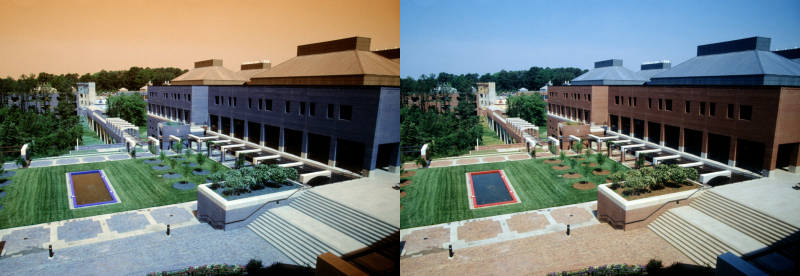

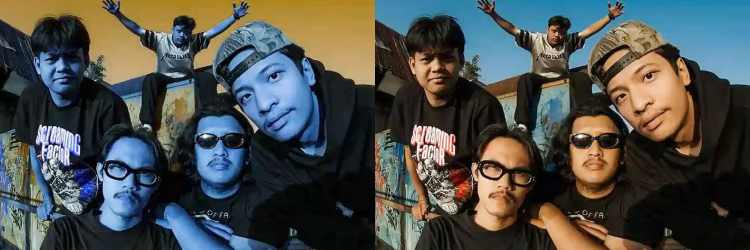

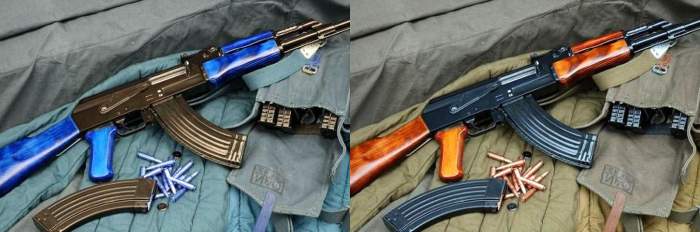

In [11]:
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
        "https://cdn-1.timesmedia.co.id/images/2024/04/05/Dazzle-Band.jpg",
        "https://asset-a.grid.id/crop/0x0:0x0/700x465/photo/2020/07/01/4249553001.jpg"]
#
for url in urls:
  image = io.imread(url)
  image = cv.resize(image, (0,0), fx=0.5, fy=0.5)
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

resolusi image : tinggi x lebar =  232  x  350


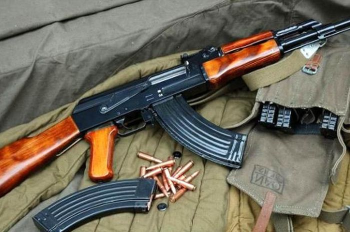

In [13]:
tinggi = image_2.shape[0]
lebar = image_2.shape[1]
print("resolusi image : tinggi x lebar = ", tinggi, " x ", lebar)
cv2_imshow(image_2)

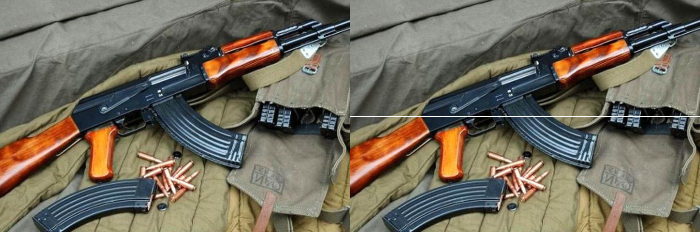

In [14]:
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

for y in range (lebar):
  image_3[int((tinggi)/2),y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)


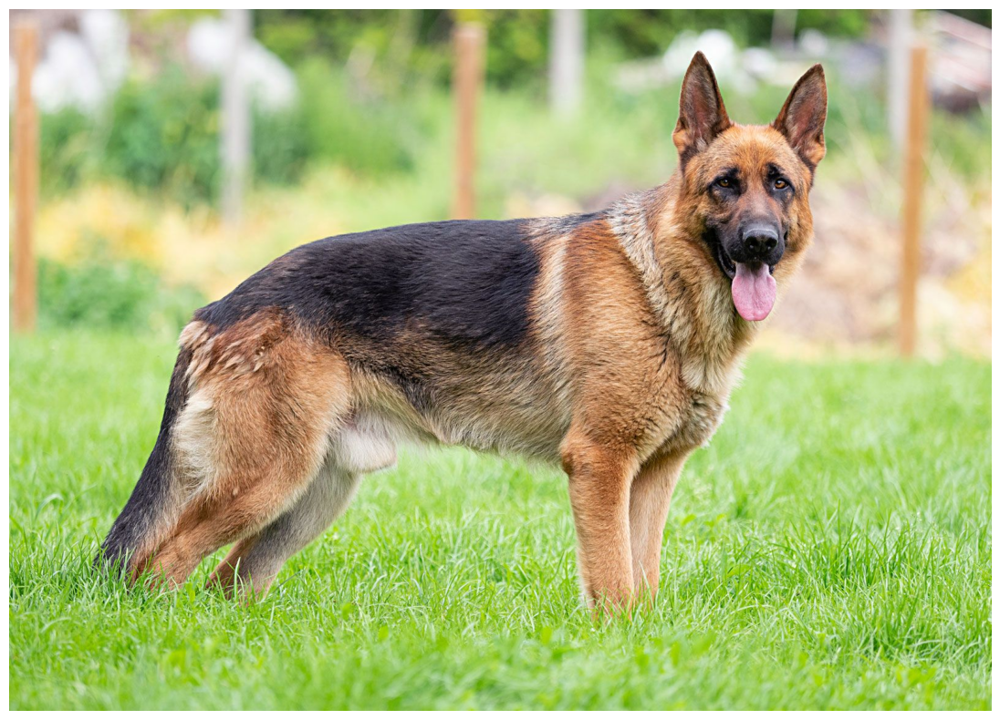

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from urllib.request import urlopen

url = "https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg"

#  membaca gambar dari URL
def baca_url(url):
    resp = urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    return image

original_image = baca_url(url)

#  menampilkan gambar
def display_image(img):
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
display_image(original_image)

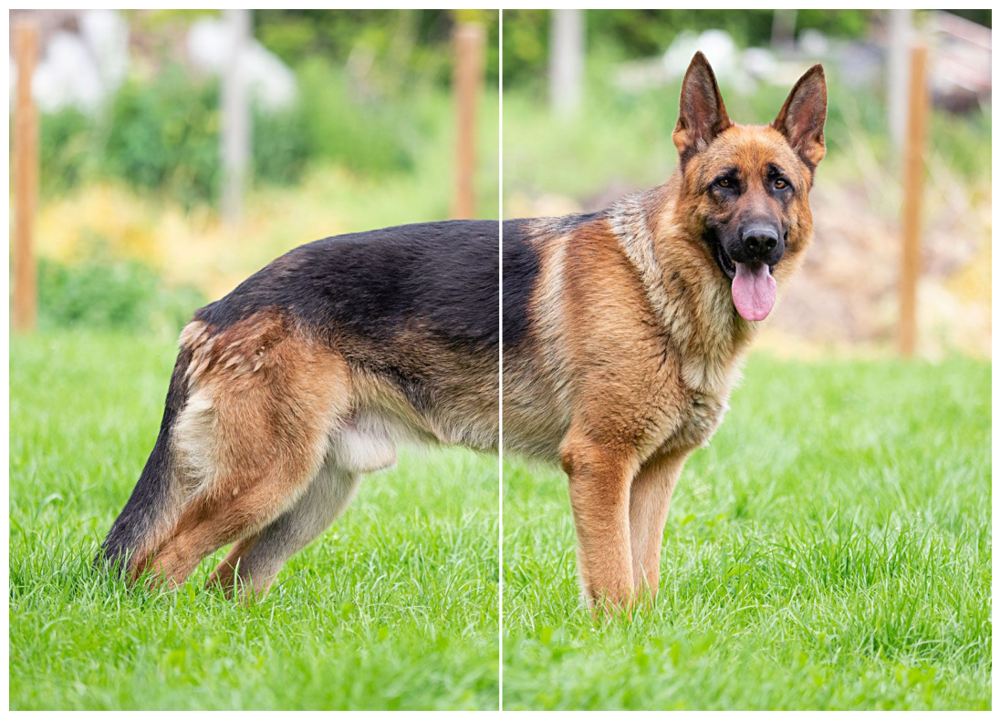

In [16]:
#Buat garis vertikal dan garis menyilang diagonal pada image
def add_lines(image):
    height, width, _ = image.shape

    #vertikal
    cv2.line(image, (width // 2, 0), (width // 2, height), (255, 255, 255), 3)

    return image
image_with_lines = add_lines(original_image.copy())
display_image(image_with_lines)

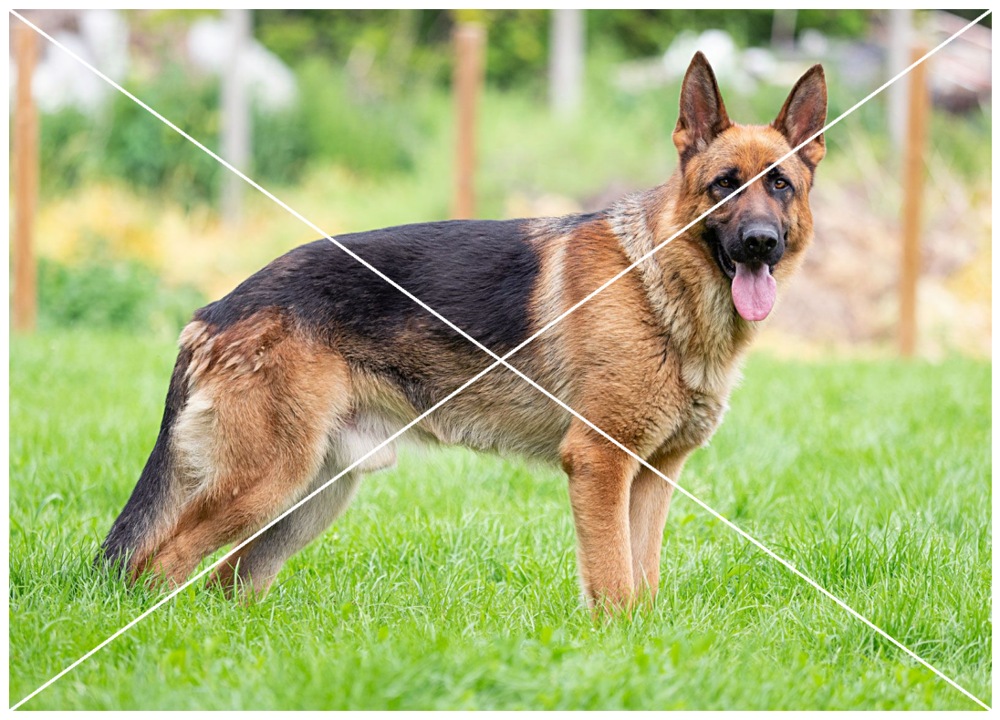

In [17]:
def add_lines(image):
    height, width, _ = image.shape
    cv2.line(image, (0, 0), (width, height), (255, 255, 255), 3)

    cv2.line(image, (width, 0), (0, height), (255, 255, 255), 3)

    return image
image_with_lines = add_lines(original_image.copy())
display_image(image_with_lines)

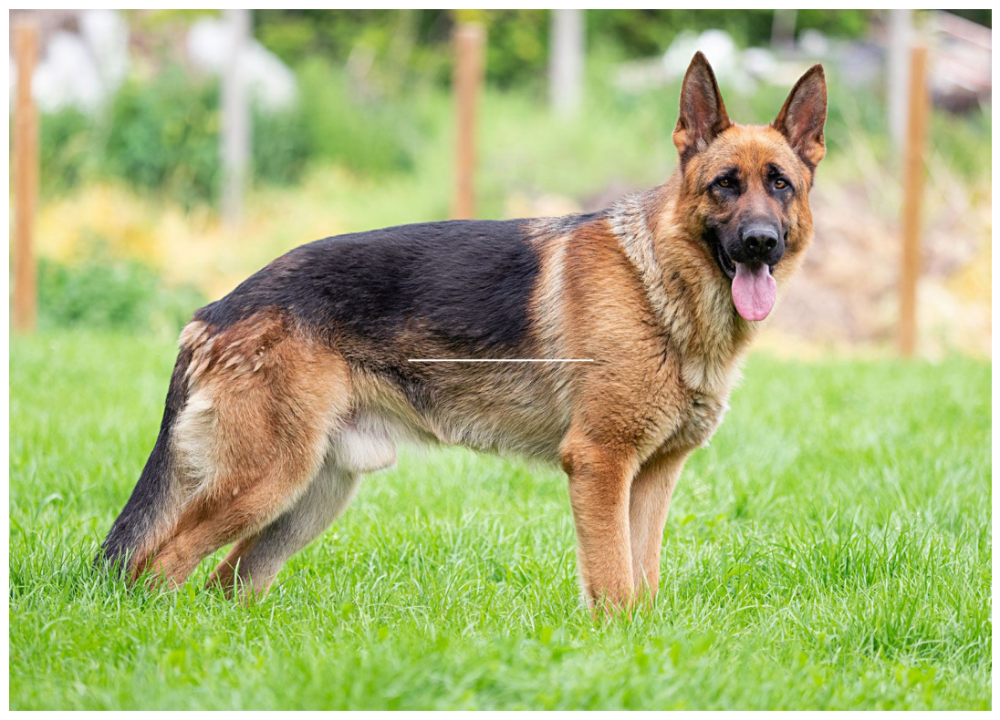

In [18]:
#Buat garis horisontal berwarna putih dibagian tengah gambar dengan panjang tertentu
def add_horizontal_line(image, line_length):
    height, width, _ = image.shape
    img_copy = image.copy()
    center_y = height // 2
    start_x = (width - line_length) // 2
    end_x = start_x + line_length
    cv2.line(img_copy, (start_x, center_y), (end_x, center_y), (255, 255, 255), 2)

    return img_copy
line_length = 300
image_with_horizontal_line = add_horizontal_line(original_image.copy(), line_length)
display_image(image_with_horizontal_line)

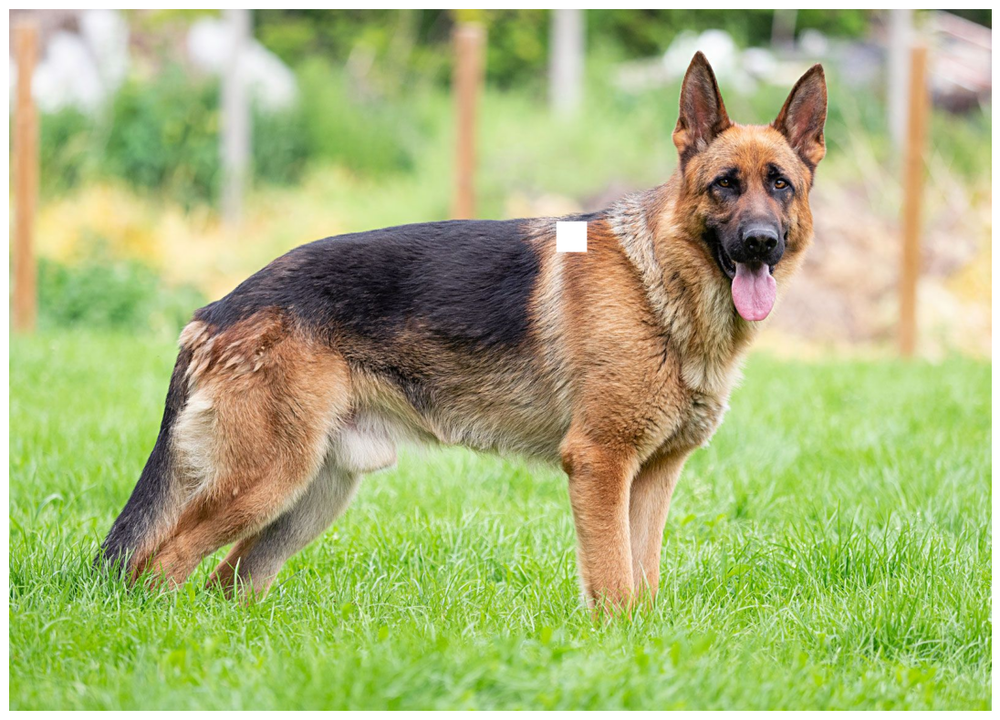

In [19]:
#Buat kotak menggunakan kumpulan pixel warna putih di sembarang tempat dalam gambar
def random_kotak(img, box_size=50):
    height, width = img.shape[:2]  # Dapatkan dimensi gambar
    img_copy = img.copy()  # Salin gambar asli

    # Tentukan posisi acak untuk kotak
    x = np.random.randint(30, width - box_size)
    y = np.random.randint(22, height - box_size)

    # Isi area kotak dengan warna putih
    img_copy[y:y+box_size, x:x+box_size] = (255, 255, 255)

    return img_copy

# Menambahkan kotak acak pada gambar asli
image_with_random_box = random_kotak(original_image.copy(), box_size=50)
display_image(image_with_random_box)